In [1]:
import pandas as pd
import numpy as np
import turicreate

In [4]:
tmp = turicreate.SArray([1., 2., 3.])
tmp_cubed = tmp.apply(lambda x: x**3)
print tmp
print tmp_cubed

[1.0, 2.0, 3.0]
[1.0, 8.0, 27.0]


In [7]:
ex_sframe = turicreate.SFrame()
ex_sframe['power_1'] = tmp
ex_sframe

power_1
1.0
2.0
3.0


In [11]:
def polynomial_sframe(feature, degree):
    # assume that degree >= 1
    # initialize the SFrame:
    poly_sframe = turicreate.SFrame()
    # and set poly_sframe['power_1'] equal to the passed feature
    poly_sframe['power_1']=feature
    # first check if degree > 1
    if degree > 1:
        # then loop over the remaining degrees:
        # range usually starts at 0 and stops at the endpoint-1. We want it to start at 2 and stop at degree
        for power in range(2, degree+1): 
            # first we'll give the column a name:
            name = 'power_' + str(power)
            # then assign poly_sframe[name] to the appropriate power of feature
            poly_sframe[name]=poly_sframe['power_1'].apply(lambda x:x**power)
    return poly_sframe

In [12]:
sales = turicreate.SFrame('home_data.sframe/')
sales = sales.sort(['sqft_living','price'])

In [13]:
poly1_data = polynomial_sframe(sales['sqft_living'], 1)
poly1_data['price'] = sales['price']

In [47]:
poly1_datas["price"] = poly1_data["price"]

In [15]:
model1 = turicreate.linear_regression.create(poly1_data, target = 'price', features = ['power_1'], validation_set = None)

Linear regression:

--------------------------------------------------------

Number of examples          : 21613

Number of features          : 1

Number of unpacked features : 1

Number of coefficients    : 2

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+--------------------+---------------------------------+

| Iteration | Passes   | Elapsed Time | Training Max Error | Training Root-Mean-Square Error |

+-----------+----------+--------------+--------------------+---------------------------------+

| 1         | 2        | 1.036892     | 4362074.696077     | 261440.790724                   |

+-----------+----------+--------------+--------------------+---------------------------------+

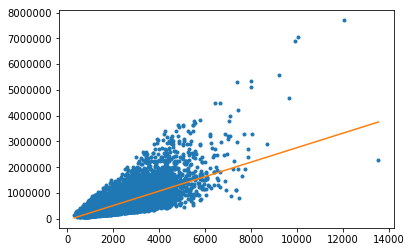

In [16]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.plot(poly1_data['power_1'],poly1_data['price'],'.',
poly1_data['power_1'], model1.predict(poly1_data),'-')

In [18]:
poly2_data = polynomial_sframe(sales['sqft_living'], 2)
my_features = poly2_data.column_names() # get the name of the features
poly2_data['price'] = sales['price'] # add price to the data since it's the target
model2 = turicreate.linear_regression.create(poly2_data, target = 'price', features = my_features, validation_set = None)

Linear regression:

--------------------------------------------------------

Number of examples          : 21613

Number of features          : 2

Number of unpacked features : 2

Number of coefficients    : 3

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+--------------------+---------------------------------+

| Iteration | Passes   | Elapsed Time | Training Max Error | Training Root-Mean-Square Error |

+-----------+----------+--------------+--------------------+---------------------------------+

| 1         | 2        | 0.011300     | 5913020.984255     | 250948.368758                   |

+-----------+----------+--------------+--------------------+---------------------------------+

SUCCESS: Optimal solution found.

In [20]:
model2.coefficients

name,index,value,stderr
(intercept),None,199222.496445,7058.00483552
power_1,None,67.9940640677,5.28787201316
power_2,None,0.0385812312789,0.000898246547032


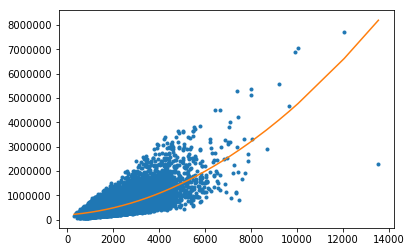

In [21]:
plt.plot(poly2_data['power_1'],poly2_data['price'],'.',
        poly2_data['power_1'], model2.predict(poly2_data),'-')

In [23]:
poly3_data = polynomial_sframe(sales['sqft_living'], 3)
my_features = poly3_data.column_names() # get the name of the features
poly3_data['price'] = sales['price'] # add price to the data since it's the target
model3 = turicreate.linear_regression.create(poly3_data, target = 'price', features = my_features, validation_set = None)

Linear regression:

--------------------------------------------------------

Number of examples          : 21613

Number of features          : 3

Number of unpacked features : 3

Number of coefficients    : 4

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+--------------------+---------------------------------+

| Iteration | Passes   | Elapsed Time | Training Max Error | Training Root-Mean-Square Error |

+-----------+----------+--------------+--------------------+---------------------------------+

| 1         | 2        | 0.019626     | 3261066.736007     | 249261.286346                   |

+-----------+----------+--------------+--------------------+---------------------------------+

SUCCESS: Optimal solution found.

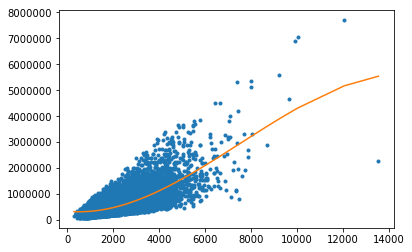

In [24]:
plt.plot(poly3_data['power_1'],poly3_data['price'],'.',
        poly3_data['power_1'], model3.predict(poly3_data),'-')

In [26]:
poly15_data = polynomial_sframe(sales['sqft_living'], 15)
my_features = poly15_data.column_names() # get the name of the features
poly15_data['price'] = sales['price'] # add price to the data since it's the target
model15 = turicreate.linear_regression.create(poly15_data, target = 'price', features = my_features, validation_set = None)

Linear regression:

--------------------------------------------------------

Number of examples          : 21613

Number of features          : 15

Number of unpacked features : 15

Number of coefficients    : 16

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+--------------------+---------------------------------+

| Iteration | Passes   | Elapsed Time | Training Max Error | Training Root-Mean-Square Error |

+-----------+----------+--------------+--------------------+---------------------------------+

| 1         | 2        | 0.049708     | 2662308.584339     | 245690.511190                   |

+-----------+----------+--------------+--------------------+---------------------------------+

SUCCESS: Optimal solution found.

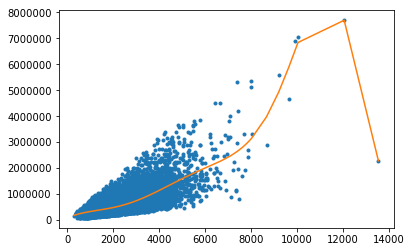

In [27]:
plt.plot(poly15_data['power_1'],poly15_data['price'],'.',
        poly15_data['power_1'], model15.predict(poly15_data),'-')

In [28]:
set_1,set_3=poly15_data.random_split(0.5,seed=0)
set_1,set_2=set_1.random_split(0.5,seed=0)
set_3,set_4=set_3.random_split(0.5,seed=0)

Linear regression:

--------------------------------------------------------

Number of examples          : 5404

Number of features          : 15

Number of unpacked features : 15

Number of coefficients    : 16

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+--------------------+---------------------------------+

| Iteration | Passes   | Elapsed Time | Training Max Error | Training Root-Mean-Square Error |

+-----------+----------+--------------+--------------------+---------------------------------+

| 1         | 2        | 0.021676     | 2195218.932304     | 248858.822200                   |

+-----------+----------+--------------+--------------------+---------------------------------+

SUCCESS: Optimal solution found.

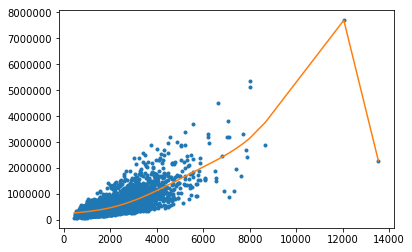

In [34]:
model15_set1 = turicreate.linear_regression.create(set_1, target = 'price', features = my_features, validation_set = None)
model15_set1.coefficients
plt.plot(set_1['power_1'],set_1['price'],'.',
        set_1['power_1'], model15_set1.predict(set_1),'-')

Linear regression:

--------------------------------------------------------

Number of examples          : 5398

Number of features          : 15

Number of unpacked features : 15

Number of coefficients    : 16

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+--------------------+---------------------------------+

| Iteration | Passes   | Elapsed Time | Training Max Error | Training Root-Mean-Square Error |

+-----------+----------+--------------+--------------------+---------------------------------+

| 1         | 2        | 0.021559     | 2069212.978547     | 234840.067186                   |

+-----------+----------+--------------+--------------------+---------------------------------+

SUCCESS: Optimal solution found.

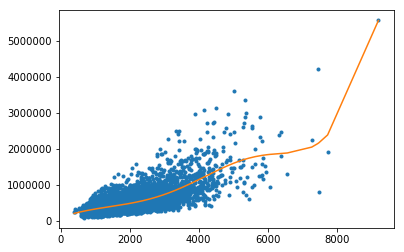

In [33]:
model15_set2 = turicreate.linear_regression.create(set_2, target = 'price', features = my_features, validation_set = None)
model15_set2.coefficients
plt.plot(set_2['power_1'],set_2['price'],'.',
        set_2['power_1'], model15_set2.predict(set_2),'-')


Linear regression:

--------------------------------------------------------

Number of examples          : 5409

Number of features          : 15

Number of unpacked features : 15

Number of coefficients    : 16

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+--------------------+---------------------------------+

| Iteration | Passes   | Elapsed Time | Training Max Error | Training Root-Mean-Square Error |

+-----------+----------+--------------+--------------------+---------------------------------+

| 1         | 2        | 0.017639     | 2269769.506522     | 251460.072754                   |

+-----------+----------+--------------+--------------------+---------------------------------+

SUCCESS: Optimal solution found.

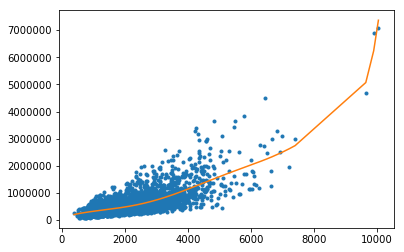

In [36]:
model15_set3 = turicreate.linear_regression.create(set_3, target = 'price', features = my_features, validation_set = None)
model15_set3.coefficients
plt.plot(set_3['power_1'],set_3['price'],'.',
        set_3['power_1'], model15_set3.predict(set_3),'-')

Linear regression:

--------------------------------------------------------

Number of examples          : 5402

Number of features          : 15

Number of unpacked features : 15

Number of coefficients    : 16

Starting Newton Method

--------------------------------------------------------

+-----------+----------+--------------+--------------------+---------------------------------+

| Iteration | Passes   | Elapsed Time | Training Max Error | Training Root-Mean-Square Error |

+-----------+----------+--------------+--------------------+---------------------------------+

| 1         | 2        | 0.021695     | 2314893.173831     | 244563.136754                   |

+-----------+----------+--------------+--------------------+---------------------------------+

SUCCESS: Optimal solution found.

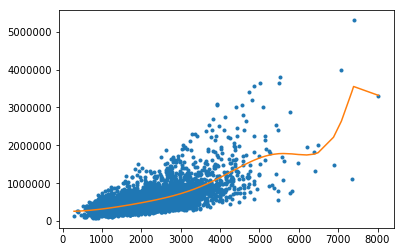

In [37]:
model15_set4 = turicreate.linear_regression.create(set_4, target = 'price', features = my_features, validation_set = None)
model15_set4.coefficients
plt.plot(set_4['power_1'],set_4['price'],'.',
        set_4['power_1'], model15_set4.predict(set_4),'-')

In [38]:
model15_set1.coefficients.print_rows(num_rows=16)
print model15_set2.coefficients.print_rows(num_rows=16)
print model15_set3.coefficients.print_rows(num_rows=16)
print model15_set4.coefficients.print_rows(num_rows=16)

+-------------+-------+--------------------+-------------------+
|     name    | index |       value        |       stderr      |
+-------------+-------+--------------------+-------------------+
| (intercept) |  None |    223312.75025    |   830108.946053   |
|   power_1   |  None |   118.086127585    |   3476.50031695   |
|   power_2   |  None |  -0.0473482011333  |    5.8999095856   |
|   power_3   |  None | 3.25310342468e-05  |  0.00528964531843 |
|   power_4   |  None | -3.3237215257e-09  | 2.71370810378e-06 |
|   power_5   |  None | -9.75830457543e-14 | 7.85008964363e-10 |
|   power_6   |  None | 1.15440303407e-17  | 1.16399778778e-13 |
|   power_7   |  None | 1.05145869411e-21  | 2.87448316886e-17 |
|   power_8   |  None | 3.46049616381e-26  | 8.38189820632e-21 |
|   power_9   |  None | -1.09654453907e-30 | 1.17553552888e-24 |
|   power_10  |  None | -2.42031812076e-34 | 7.60124208055e-29 |
|   power_11  |  None | -1.99601206924e-38 | 3.20857157381e-33 |
|   power_12  |  None | -

In [39]:
training_and_validation,testing = sales.random_split(0.9,seed=1)
training,validation = training_and_validation.random_split(0.5,seed=1)

In [41]:
for degree in range(1,16):
    poly_data = polynomial_sframe(training['sqft_living'],degree)
    vali_data = polynomial_sframe(validation['sqft_living'],degree)
    my_features = poly_data.column_names()
    poly_data['price'] = training['price']
    model = turicreate.linear_regression.create(poly_data,target='price',
                                             features = my_features,
                                             validation_set=None,
                                             verbose=False)
    predict = model.predict(vali_data)
    residual = predict - validation['price']
    rss = (residual**2).sum()
    print degree,rss

1 6.76709775198e+14
2 6.07090530698e+14
3 6.16714574533e+14
4 6.09129230654e+14
5 5.99177138584e+14
6 5.8918247781e+14
7 5.91717038418e+14
8 6.01558237777e+14
9 6.12563853988e+14
10 6.21744288938e+14
11 6.27012012704e+14
12 6.27757914767e+14
13 6.24738503264e+14
14 6.19369705893e+14
15 6.13089202412e+14


In [45]:
poly_data_6 = polynomial_sframe(training['sqft_living'],6)
test_data = polynomial_sframe(testing['sqft_living'],6)
my_features = poly_data_6.column_names()
poly_data_6['price'] = training['price']
model_6 = turicreate.linear_regression.create(poly_data_6,target='price',
                                             features = my_features,
                                             validation_set=None,
                                             verbose=False)
predict_6 = model_6.predict(test_data)
residual = predict_6 - testing['price']
rss = (residual**2).sum()
print rss

1.25529337848e+14
